In [ ]:
from pyspark.sql import SparkSession

spark = SparkSession \
    .builder \
    .appName("Create Spark Dataframe") \
    .getOrCreate()

In [ ]:
spark.conf.set("", "")

Database = "dedicateddef"
Server = "serengetidatalab.sql.azuresynapse.net"
User = "user@serengetidatalab"
# Pass = sqladmin00!
JdbcPort =  "1433"
Pass = ""
JdbcExtraOptions = "encrypt=true;trustServerCertificate=true;hostNameInCertificate=*.database.windows.net;loginTimeout=30;"

sqlUrl = f"jdbc:sqlserver://{Server}:{JdbcPort};database={Database};user={User};password={Pass};${JdbcExtraOptions}"

tableName = "train"

tempDir = "abfss://snapshot-serengeti@serengeti.dfs.core.windows.net/"

df = spark.read \
  .format("jdbc") \
  .option("url", sqlUrl) \
  .option("tempDir", tempDir) \
  .option("forwardSparkAzureStorageCredentials", "true") \
  .option("dbTable", tableName) \
  .load()

# df.show()


In [ ]:
df.show()

+--------------------+---------------+
|            image_id|           name|
+--------------------+---------------+
|S4/B06/B06_R2/S4_...|         impala|
|S3/S07/S07_R12/S3...|     wildebeest|
|S3/S07/S07_R12/S3...|     wildebeest|
|S3/U10/U10_R11/S3...|          zebra|
|S3/U10/U10_R11/S3...|     hartebeest|
|SER_S11/P13/P13_R...|        cheetah|
|SER_S11/J09/J09_R...|          zebra|
|S2/K03/K03_R2/S2_...|     wildebeest|
|S6/S13/S13_R2/S6_...|   hyenaspotted|
|S9/I02/I02_R2/S9_...|          zebra|
|S1/O05/O05_R1/S1_...|     guineafowl|
|S10/F06/F06_R1/S1...|     wildebeest|
|S1/Q11/Q11_R1/S1_...|gazellethomsons|
|S1/Q11/Q11_R1/S1_...|gazellethomsons|
|S8/H05/H05_R3/S8_...|     wildebeest|
|S1/R10/R10_R1/S1_...|  gazellegrants|
|S9/K06/K06_R2/S9_...|gazellethomsons|
|S3/E04/E04_R12/S3...|     wildebeest|
|S4/E04/E04_R2/S4_...|         impala|
|S4/E13/E13_R2/S4_...|     wildebeest|
+--------------------+---------------+
only showing top 20 rows



In [ ]:
tableName2 = "val"

df_val = spark.read \
  .format("jdbc") \
  .option("url", sqlUrl) \
  .option("tempDir", tempDir) \
  .option("forwardSparkAzureStorageCredentials", "true") \
  .option("dbTable", tableName2) \
  .load()

df_val.show()

+--------------------+---------------+
|            image_id|           name|
+--------------------+---------------+
|S8/K09/K09_R2/S8_...|          zebra|
|S4/K11/K11_R2/S4_...|     wildebeest|
|S7/L05/L05_R2/S7_...|gazellethomsons|
|S4/M13/M13_R2/S4_...|gazellethomsons|
|S7/M05/M05_R3/S7_...|gazellethomsons|
|S7/M07/M07_R2/S7_...|      otherbird|
|SER_S11/H04/H04_R...|gazellethomsons|
|S5/I12/I12_R1/S5_...|       elephant|
|S2/D03/D03_R3/S2_...|     wildebeest|
|S2/D03/D03_R3/S2_...|          zebra|
|S5/U09/U09_R3/S5_...|   hyenaspotted|
|S3/P05/P05_R11/S3...|gazellethomsons|
|S2/E01/E01_R4/S2_...|          zebra|
|S2/E01/E01_R4/S2_...|          zebra|
|S9/I05/I05_R2/S9_...|     wildebeest|
|SER_S11/Q06/Q06_R...|          zebra|
|S9/J04/J04_R2/S9_...|     wildebeest|
|S9/J04/J04_R2/S9_...|          zebra|
|S9/J04/J04_R2/S9_...|     wildebeest|
|S2/H04/H04_R2/S2_...|          zebra|
+--------------------+---------------+
only showing top 20 rows



In [ ]:
import pandas as pd 
df = df.toPandas()

In [ ]:
from PIL import Image
import pandas as pd
import requests


def imageURL(img_id):
    return f"https://lilablobssc.blob.core.windows.net/snapshotserengeti-unzipped/{img_id}.JPG"

df["image_link"] = df["image_id"].apply(imageURL)
df.head(1)


,image_id,name,image_link
0,S4/B06/B06_R2/S4_B06_R2_IMAG1101,impala,https://lilablobssc.blob.core.windows.net/snap...


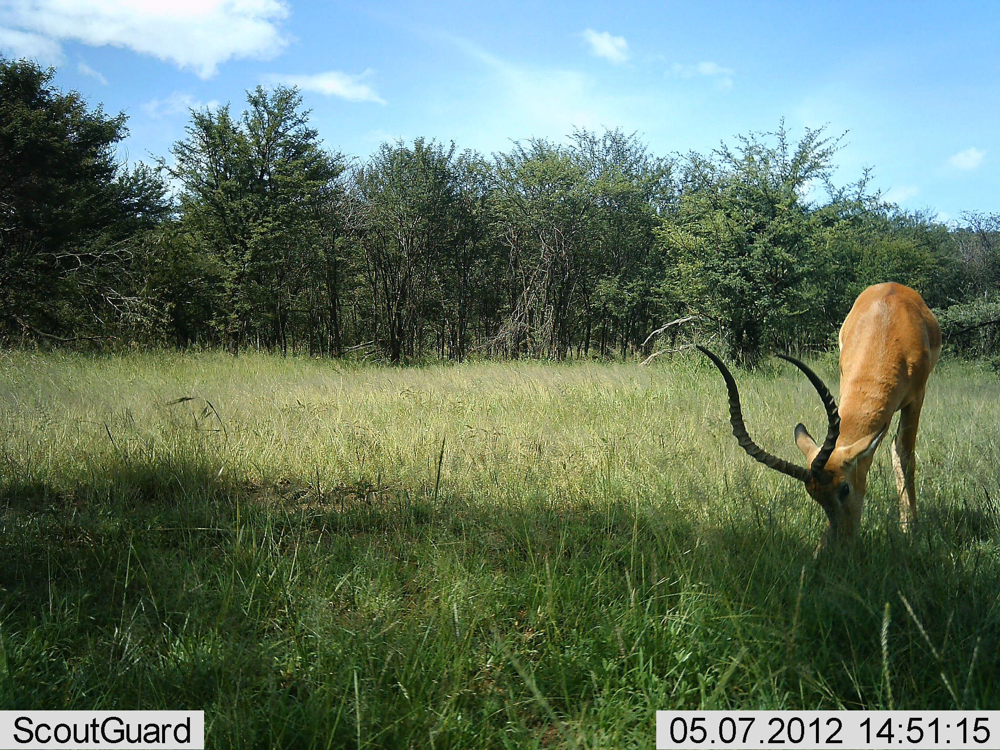

In [ ]:
from PIL import Image
import requests

url = df.iloc[0]["image_link"]
response = requests.get(url)

# Load an image using Image.open()
img = Image.open(requests.get(url, stream=True).raw)

# Show the image using img.show()
img.show()



In [ ]:
df["name"].nunique()

Out[9]: 59

In [ ]:
import pandas as pd 
df_val= df_val.toPandas()

df_val

,image_id,name
0,S8/K09/K09_R2/S8_K09_R2_IMAG0626,zebra
1,S4/K11/K11_R2/S4_K11_R2_IMAG1905,wildebeest
2,S7/L05/L05_R2/S7_L05_R2_IMAG1826,gazellethomsons
3,S4/M13/M13_R2/S4_M13_R2_IMAG1295,gazellethomsons
4,S7/M05/M05_R3/S7_M05_R3_IMAG1215,gazellethomsons
...,...,...
462962,SER_S11/K13/K13_R2/SER_S11_K13_R2_IMAG2977,gazellethomsons
462963,SER_S11/K13/K13_R2/SER_S11_K13_R2_IMAG2978,gazellegrants
462964,SER_S11/K13/K13_R2/SER_S11_K13_R2_IMAG2979,gazellegrants
462965,SER_S11/K13/K13_R2/SER_S11_K13_R2_IMAG2980,gazellegrants


In [ ]:
df_val["image_link"] = df_val["image_id"].apply(imageURL)

df_val

,image_id,name,image_link
0,S8/K09/K09_R2/S8_K09_R2_IMAG0626,zebra,https://lilablobssc.blob.core.windows.net/snap...
1,S4/K11/K11_R2/S4_K11_R2_IMAG1905,wildebeest,https://lilablobssc.blob.core.windows.net/snap...
2,S7/L05/L05_R2/S7_L05_R2_IMAG1826,gazellethomsons,https://lilablobssc.blob.core.windows.net/snap...
3,S4/M13/M13_R2/S4_M13_R2_IMAG1295,gazellethomsons,https://lilablobssc.blob.core.windows.net/snap...
4,S7/M05/M05_R3/S7_M05_R3_IMAG1215,gazellethomsons,https://lilablobssc.blob.core.windows.net/snap...
...,...,...,...
462962,SER_S11/K13/K13_R2/SER_S11_K13_R2_IMAG2977,gazellethomsons,https://lilablobssc.blob.core.windows.net/snap...
462963,SER_S11/K13/K13_R2/SER_S11_K13_R2_IMAG2978,gazellegrants,https://lilablobssc.blob.core.windows.net/snap...
462964,SER_S11/K13/K13_R2/SER_S11_K13_R2_IMAG2979,gazellegrants,https://lilablobssc.blob.core.windows.net/snap...
462965,SER_S11/K13/K13_R2/SER_S11_K13_R2_IMAG2980,gazellegrants,https://lilablobssc.blob.core.windows.net/snap...


In [ ]:
df["image_link"] = df["image_link"].astype(str)
df.head(1)

,image_id,name,image_link
0,S4/B06/B06_R2/S4_B06_R2_IMAG1101,impala,https://lilablobssc.blob.core.windows.net/snap...


In [ ]:
import multiprocessing as mp

def load_image(url, queue):
    try:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img = img.resize((224, 224), Image.ANTIALIAS)
        image = np.array(img)
        queue.put(image)
    except:
        queue.put(None)
        
def load_images(image_urls):
    manager = mp.Manager()
    queue = manager.Queue()
    processes = []
    
    for url in image_urls:
        process = mp.Process(target=load_image, args=(url, queue))
        process.start()
        processes.append(process)
        
    images = []
    success_count = 0
    failure_count = 0
    
    for _ in range(len(image_urls)):
        image = queue.get()
        if image is not None:
            images.append(image)
            success_count += 1
        else:
            failure_count += 1
            
    for process in processes:
        process.join()
        
    train_data = np.stack(images)
    
    print("Successful loads:", success_count)
    print("Failed loads:", failure_count)
    
    return train_data


In [ ]:
# train test data

x_train = df["image_link"] 
x_val = df_val["image_link"] 
y_train = df["name"]
y_val = df_val["name"]

In [ ]:
pip install torch

Python interpreter will be restarted.
Python interpreter will be restarted.


In [ ]:
pip install torchvision

Python interpreter will be restarted.
Python interpreter will be restarted.


In [ ]:
pip install tensorflow

Python interpreter will be restarted.
Python interpreter will be restarted.


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models

# Load a pretrained ResNet model
model = models.resnet50(pretrained=True)

# Freeze all layers except the final fully connected layer
for param in model.parameters():
    param.requires_grad = False
model.fc.requires_grad = True

# Replace the final fully connected layer with a new layer
# adapted to your specific data
num_classes = 59 # number of classes in your data
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Train the model using your data
...


/local_disk0/.ephemeral_nfs/envs/pythonEnv-486c72bb-4e5b-42b6-bcfa-d274c46e8ca5/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/local_disk0/.ephemeral_nfs/envs/pythonEnv-486c72bb-4e5b-42b6-bcfa-d274c46e8ca5/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Out[1]: Ellipsis

In [ ]:
pip install keras

Python interpreter will be restarted.
Python interpreter will be restarted.


In [ ]:
import keras
from keras.applications import ResNet50
from keras.preprocessing import image
from keras.layers import Dense, GlobalAveragePooling2D
from keras.optimizers import SGD
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator

num_classes = 59
# Load the ResNet50 model pre-trained on ImageNet
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

# Freeze all layers of the pre-trained model
for layer in resnet_model.layers:
    layer.trainable = False

# Add new trainable layers on top of the frozen layers
x = resnet_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Compile the model
model = Model(inputs=resnet_model.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# Create ImageDataGenerator objects for the training and validation sets
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
            
            
# Use the flow_from_dataframe method to load the data
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df,
    x_col='image_link',
    y_col='name',
    directory=None,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical')

val_generator = val_datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col='image_link',
    y_col='name',
    directory=None,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical')

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(train_generator, epochs=10, steps_per_epoch=100)


/local_disk0/.ephemeral_nfs/envs/pythonEnv-486c72bb-4e5b-42b6-bcfa-d274c46e8ca5/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/gradient_descent.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
<command-4257990785246540> in <cell line: 34>()
     33 # Use the flow_from_dataframe method to load the data
     34 train_generator = train_datagen.flow_from_dataframe(
---> 35     dataframe=df,
     36     x_col='image_link',
     37     y_col='name',

NameError: name 'df' is not defined

In [ ]:
from keras.applications import ResNet50
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, GlobalAveragePooling2D
from keras.models import Model

# Load ResNet50 model
resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

# Add a new layer to the model
x = resnet.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Create a new model
model = Model(inputs=resnet.input, outputs=predictions)


In [ ]:
from PIL import Image
import requests

# Load an image using Image.open()
img = Image.open(requests.get(url, stream=True).raw)

def readImage(url):
    response = requests.get(url)
    return Image.open(requests.get(url, stream=True).raw)

for url in df["image_link"]:
    img = readImage(url)
    img.show()

In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df,
    x_col='image_link',
    y_col='name',
    directory=None,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical')